In [1]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tdfs

In [2]:
dataset, info = tdfs.load('oxford_iiit_pet:3.*.*', with_info=True)
dataset

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incomplete9MQPAU/oxford_iiit_pet-train.tfrecord*...:…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incomplete9MQPAU/oxford_iiit_pet-test.tfrecord*...: …

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0. Subsequent calls will reuse this data.


{'train': <_PrefetchDataset element_spec={'file_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None), 'segmentation_mask': TensorSpec(shape=(None, None, 1), dtype=tf.uint8, name=None), 'species': TensorSpec(shape=(), dtype=tf.int64, name=None)}>,
 'test': <_PrefetchDataset element_spec={'file_name': TensorSpec(shape=(), dtype=tf.string, name=None), 'image': TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None), 'segmentation_mask': TensorSpec(shape=(None, None, 1), dtype=tf.uint8, name=None), 'species': TensorSpec(shape=(), dtype=tf.int64, name=None)}>}

In [7]:
import matplotlib.pyplot as plt

def display_images(l,titles=None,fontsize=12):
    n=len(l)
    fig,ax = plt.subplots(1,n)
    for i,im in enumerate(l):
        ax[i].imshow(im)
        ax[i].axis('off')
        if titles is not None:
            ax[i].set_title(titles[i],fontsize=fontsize)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()

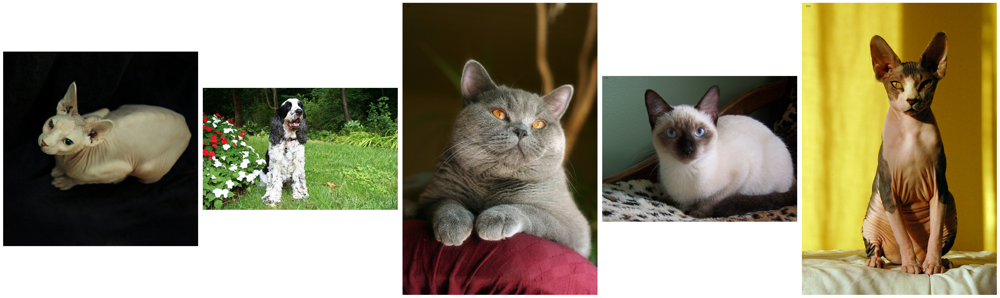

In [8]:
display_images([x['image'] for i,x in zip(range(5),dataset['train'])])

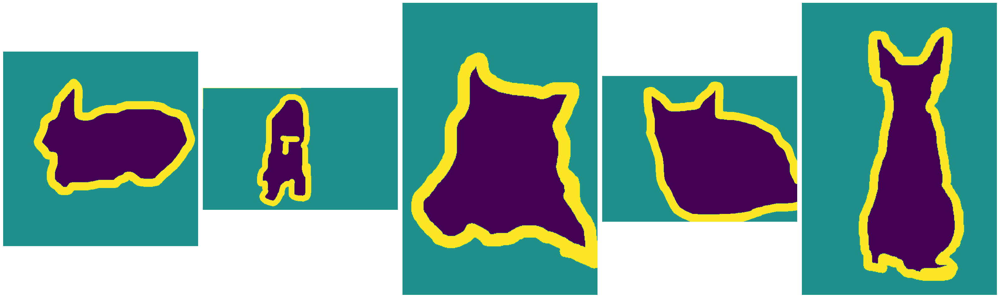

In [9]:
display_images([x['segmentation_mask'] for i,x in zip(range(5),dataset['train'])])

In [11]:
import numpy as np

for x in dataset['train']:
  print(np.min(x['segmentation_mask']))
  break

1


In [12]:
def load_image(x):
  input_image = tf.image.resize(x['image'], (128, 128))/255.0
  input_mask = tf.image.resize(x['segmentation_mask'], (128, 128))-1
  return input_image, input_mask

train_images = dataset['train'].map(load_image)
test_images = dataset['test'].map(load_image)

In [13]:
for x,m in train_images:
  print(x.shape,m.shape)
  break

(128, 128, 3) (128, 128, 1)


In [15]:
model = keras.models.Sequential([
    keras.layers.Conv2D(10,5,input_shape=(128,128,3),activation='relu',padding='same'),
    keras.layers.Conv2D(20,5,activation='relu',padding='same'),
    #keras.layers.Conv2D(3,1,activation=None,padding='same')
    keras.layers.Dense(3,activation=None)
    ])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 128, 128, 10)      760       
                                                                 
 conv2d_4 (Conv2D)           (None, 128, 128, 20)      5020      
                                                                 
 dense (Dense)               (None, 128, 128, 3)       63        
                                                                 
Total params: 5,843
Trainable params: 5,843
Non-trainable params: 0
_________________________________________________________________


In [16]:
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile('adam',loss,['acc'])

train_batch = train_images.cache().shuffle(1000).batch(32)
test_batch = test_images.cache().shuffle(1000).batch(32)

hist = model.fit(train_batch,validation_data=test_batch,epochs=10)

Epoch 1/10
115/115 [==============================] - 39s 222ms/step - loss: 0.9208 - acc: 0.5757 - val_loss: 0.8790 - val_acc: 0.5672
Epoch 2/10
115/115 [==============================] - 4s 31ms/step - loss: 0.8488 - acc: 0.5787 - val_loss: 0.8438 - val_acc: 0.5770
Epoch 3/10
115/115 [==============================] - 4s 32ms/step - loss: 0.8304 - acc: 0.5849 - val_loss: 0.8356 - val_acc: 0.5824
Epoch 4/10
115/115 [==============================] - 3s 29ms/step - loss: 0.8195 - acc: 0.5923 - val_loss: 0.8251 - val_acc: 0.5914
Epoch 5/10
115/115 [==============================] - 3s 30ms/step - loss: 0.8148 - acc: 0.5962 - val_loss: 0.8223 - val_acc: 0.5999
Epoch 6/10
115/115 [==============================] - 6s 48ms/step - loss: 0.8024 - acc: 0.6079 - val_loss: 0.7962 - val_acc: 0.6066
Epoch 7/10
115/115 [==============================] - 4s 31ms/step - loss: 0.7754 - acc: 0.6278 - val_loss: 0.7796 - val_acc: 0.6190
Epoch 8/10
115/115 [==============================] - 3s 29ms/step 

1/1 [==============================] - 0s 213ms/step


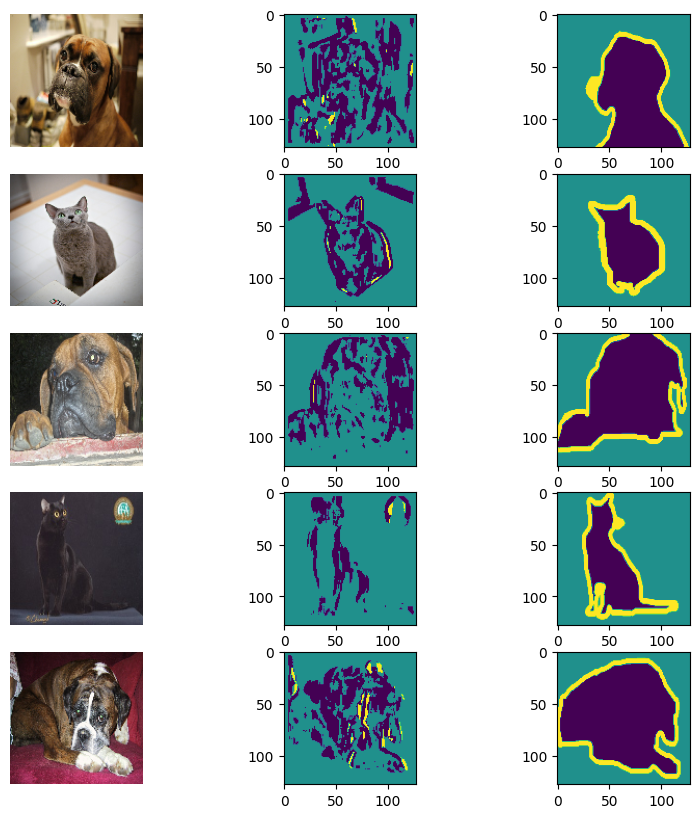

In [17]:
def plot_results(test_batch):
  for x,y in test_batch:
    break

  pred = model.predict(x[:5])
  pred = tf.argmax(pred,axis=-1)

  fig,ax = plt.subplots(5,3,figsize=(10,10))
  for i,(x,y,p) in enumerate(zip(x[:5],y[:5],pred[:5])):
    ax[i,0].imshow(x)
    ax[i,0].axis('off')
    ax[i,1].imshow(p)
    ax[i,0].axis('off')
    ax[i,2].imshow(y)
    ax[i,0].axis('off')

plot_results(test_batch)

In [18]:
model = keras.models.Sequential([
    keras.layers.Conv2D(16,3,padding='same',activation='relu',input_shape=(128,128,3)),
    keras.layers.MaxPool2D(),
    keras.layers.Conv2D(32,3,padding='same',activation='relu'),
    keras.layers.MaxPool2D(),
    keras.layers.Conv2D(64,3,padding='same',activation='relu'),
    keras.layers.MaxPool2D(),

    keras.layers.Conv2D(128,3,padding='same',activation='relu'),

    keras.layers.UpSampling2D(interpolation='bilinear'),
    keras.layers.Conv2D(64,3,padding='same',activation='relu'),
    keras.layers.UpSampling2D(interpolation='bilinear'),
    keras.layers.Conv2D(32,3,padding='same',activation='relu'),
    keras.layers.UpSampling2D(interpolation='bilinear'),
    keras.layers.Conv2D(16,3,padding='same',activation='relu'),
    keras.layers.Conv2D(3,1,activation=None,padding='same')
])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 64)      

In [19]:
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile('adam',loss,['acc'])

hist = model.fit(train_batch,validation_data=test_batch,epochs=10)

Epoch 1/10
115/115 [==============================] - 12s 56ms/step - loss: 0.8153 - acc: 0.6360 - val_loss: 0.7569 - val_acc: 0.6824
Epoch 2/10
115/115 [==============================] - 6s 48ms/step - loss: 0.6887 - acc: 0.7049 - val_loss: 0.6485 - val_acc: 0.7166
Epoch 3/10
115/115 [==============================] - 6s 49ms/step - loss: 0.6153 - acc: 0.7356 - val_loss: 0.5877 - val_acc: 0.7496
Epoch 4/10
115/115 [==============================] - 7s 58ms/step - loss: 0.5799 - acc: 0.7538 - val_loss: 0.5444 - val_acc: 0.7720
Epoch 5/10
115/115 [==============================] - 6s 48ms/step - loss: 0.5483 - acc: 0.7694 - val_loss: 0.5229 - val_acc: 0.7816
Epoch 6/10
115/115 [==============================] - 7s 57ms/step - loss: 0.5213 - acc: 0.7810 - val_loss: 0.5079 - val_acc: 0.7887
Epoch 7/10
115/115 [==============================] - 5s 47ms/step - loss: 0.5040 - acc: 0.7886 - val_loss: 0.5045 - val_acc: 0.7889
Epoch 8/10
115/115 [==============================] - 5s 48ms/step -

1/1 [==============================] - 1s 579ms/step


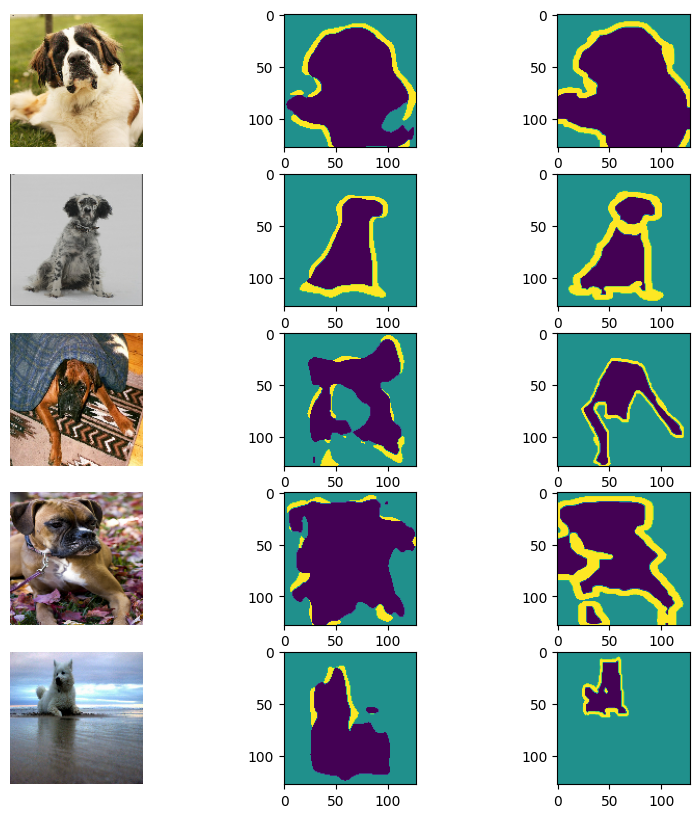

In [20]:
plot_results(test_batch)

In [23]:
class SegNet(tf.keras.Model): # simplified SegNet
    def __init__(self):
        super().__init__()
        self.enc_conv0 = keras.layers.Conv2D(16, kernel_size=3, padding='same')
        self.bn0 = keras.layers.BatchNormalization()
        self.pool0 = keras.layers.MaxPool2D()

        self.enc_conv1 = keras.layers.Conv2D(32, kernel_size=3, padding='same')
        self.bn1 = keras.layers.BatchNormalization()
        self.pool1 = keras.layers.MaxPool2D()

        self.enc_conv2 = keras.layers.Conv2D(64, kernel_size=3, padding='same')
        self.bn2 = keras.layers.BatchNormalization()
        self.pool2 = keras.layers.MaxPool2D()

        self.bottleneck_conv = keras.layers.Conv2D(128, kernel_size=(3, 3), padding='same')

        self.upsample1 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv1 = keras.layers.Conv2D(64, kernel_size=3, padding='same')
        self.dec_bn1 = keras.layers.BatchNormalization()

        self.upsample2 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv2 = keras.layers.Conv2D(32, kernel_size=3, padding='same')
        self.dec_bn2 = keras.layers.BatchNormalization()

        self.upsample3 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv3 = keras.layers.Conv2D(3, kernel_size=1)

    def call(self, input):
        e0 = self.pool0(tf.nn.relu(self.bn0(self.enc_conv0(input))))
        e1 = self.pool1(tf.nn.relu(self.bn1(self.enc_conv1(e0))))
        e2 = self.pool2(tf.nn.relu(self.bn2(self.enc_conv2(e1))))

        b = self.bottleneck_conv(e2)

        d1 = tf.nn.relu(self.dec_bn1(self.upsample1(self.dec_conv1(b))))
        d2 = tf.nn.relu(self.dec_bn2(self.upsample2(self.dec_conv2(d1))))
        d3 = self.dec_conv3(self.upsample3(d2))

        return d3

Epoch 1/10
115/115 [==============================] - 10s 50ms/step - loss: 0.6860 - acc: 0.7079 - val_loss: 0.8614 - val_acc: 0.5990
Epoch 2/10
115/115 [==============================] - 4s 37ms/step - loss: 0.5492 - acc: 0.7687 - val_loss: 0.7249 - val_acc: 0.6872
Epoch 3/10
115/115 [==============================] - 4s 37ms/step - loss: 0.5004 - acc: 0.7910 - val_loss: 0.5847 - val_acc: 0.7540
Epoch 4/10
115/115 [==============================] - 4s 38ms/step - loss: 0.4763 - acc: 0.8012 - val_loss: 0.5350 - val_acc: 0.7764
Epoch 5/10
115/115 [==============================] - 4s 37ms/step - loss: 0.4551 - acc: 0.8103 - val_loss: 0.4695 - val_acc: 0.8028
Epoch 6/10
115/115 [==============================] - 6s 48ms/step - loss: 0.4368 - acc: 0.8182 - val_loss: 0.4700 - val_acc: 0.8076
Epoch 7/10
115/115 [==============================] - 4s 36ms/step - loss: 0.4215 - acc: 0.8242 - val_loss: 0.4898 - val_acc: 0.8026
Epoch 8/10
115/115 [==============================] - 4s 36ms/step -

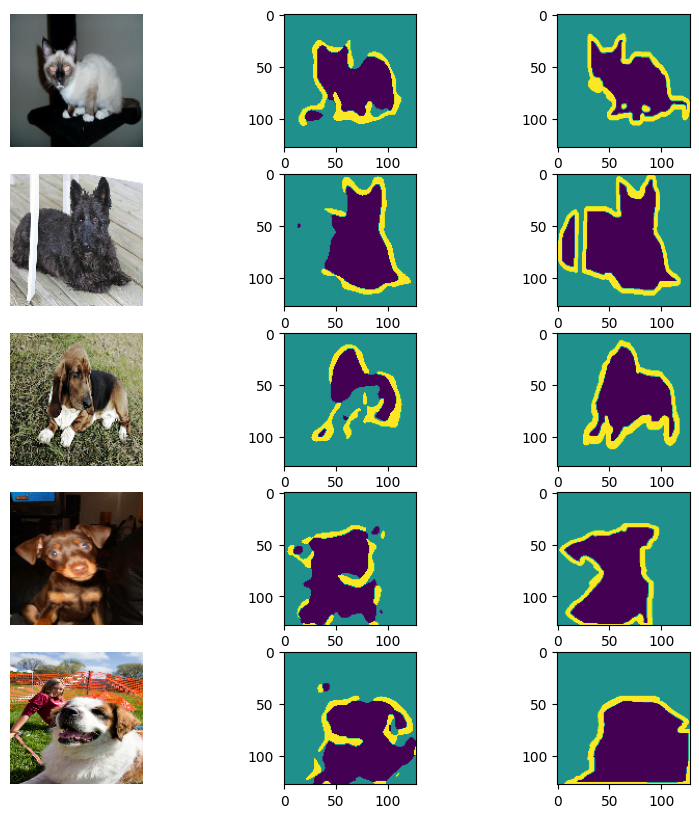

In [24]:
model = SegNet()

loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile('adam',loss,['acc'])

hist = model.fit(train_batch,validation_data=test_batch,epochs=10)
plot_results(test_batch)

In [31]:
class UNet(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.enc_conv0 = keras.layers.Conv2D(16, kernel_size=3, padding='same')
        self.bn0 = keras.layers.BatchNormalization()
        self.pool0 = keras.layers.MaxPool2D()

        self.enc_conv1 = keras.layers.Conv2D(32, kernel_size=3, padding='same')
        self.bn1 = keras.layers.BatchNormalization()
        self.pool1 = keras.layers.MaxPool2D()

        self.enc_conv2 = keras.layers.Conv2D(64, kernel_size=3, padding='same')
        self.bn2 = keras.layers.BatchNormalization()
        self.pool2 = keras.layers.MaxPool2D()

        self.enc_conv3 = keras.layers.Conv2D(128, kernel_size=3, padding='same')
        self.bn3 = keras.layers.BatchNormalization()
        self.pool3 = keras.layers.MaxPool2D()

        self.bottleneck_conv = keras.layers.Conv2D(256, kernel_size=(3, 3), padding='same')

        self.upsample0 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv0 = keras.layers.Conv2D(128, kernel_size=3, padding='same', input_shape=[None, 384, None, None])
        self.dec_bn0 = keras.layers.BatchNormalization()

        self.upsample1 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv1 = keras.layers.Conv2D(64, kernel_size=3, padding='same', input_shape=[None, 192, None, None])
        self.dec_bn1 = keras.layers.BatchNormalization()

        self.upsample2 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv2 = keras.layers.Conv2D(32, kernel_size=3, padding='same', input_shape=[None, 96, None, None])
        self.dec_bn2 = keras.layers.BatchNormalization()

        self.upsample3 =  keras.layers.UpSampling2D(interpolation='bilinear')
        self.dec_conv3 = keras.layers.Conv2D(1, kernel_size=1, input_shape=[None, 48, None, None])

    def call(self, input):
        cat0 = tf.nn.relu(self.bn0(self.enc_conv0(input)))
        e0 = self.pool0(cat0)
        cat1 = tf.nn.relu(self.bn1(self.enc_conv1(e0)))
        e1 = self.pool0(cat1)
        cat2 = tf.nn.relu(self.bn2(self.enc_conv2(e1)))
        e2 = self.pool0(cat2)
        cat3 = tf.nn.relu(self.bn3(self.enc_conv3(e2)))
        e3 = self.pool0(cat3)

        b = self.bottleneck_conv(e3)

        cat_tens0 = tf.concat([self.upsample0(b), cat3],axis=3)
        d0 = tf.nn.relu(self.dec_bn0(self.dec_conv0(cat_tens0)))

        cat_tens1 = tf.concat([self.upsample1(d0), cat2],axis=3)
        d1 = tf.nn.relu(self.dec_bn1(self.dec_conv1(cat_tens1)))

        cat_tens2 = tf.concat([self.upsample2(d1), cat1],axis=3)
        d2 = tf.nn.relu(self.dec_bn2(self.dec_conv2(cat_tens2)))

        cat_tens3 = tf.concat([self.upsample3(d2), cat0],axis=3)
        d3 = self.dec_conv3(cat_tens3)

        return d3

model = UNet()
model.build(input_shape=(1,128,128,3))
model.summary()

Model: "u_net_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          multiple                  448       
                                                                 
 batch_normalization_26 (Bat  multiple                 64        
 chNormalization)                                                
                                                                 
 max_pooling2d_18 (MaxPoolin  multiple                 0         
 g2D)                                                            
                                                                 
 conv2d_49 (Conv2D)          multiple                  4640      
                                                                 
 batch_normalization_27 (Bat  multiple                 128       
 chNormalization)                                                
                                                           

In [32]:
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile('adam',loss,['acc'])

hist = model.fit(train_batch,validation_data=test_batch,epochs=10)

Epoch 1/10
115/115 [==============================] - 15s 62ms/step - loss: nan - acc: 0.2953 - val_loss: nan - val_acc: 0.2957
Epoch 2/10
115/115 [==============================] - 7s 58ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 3/10
115/115 [==============================] - 6s 57ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 4/10
115/115 [==============================] - 7s 57ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 5/10
115/115 [==============================] - 7s 58ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 6/10
115/115 [==============================] - 6s 56ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 7/10
115/115 [==============================] - 7s 57ms/step - loss: nan - acc: 0.2950 - val_loss: nan - val_acc: 0.2957
Epoch 8/10
115/115 [==============================] - 7s 61ms/step - loss: nan - acc: 0.2950 - val_loss: nan -

Segmentation with transfer learning

In [36]:
!git clone https://github.com/tensorflow/examples

Cloning into 'examples'...
remote: Enumerating objects: 23066, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 23066 (delta 6), reused 7 (delta 0), pack-reused 23038
Receiving objects: 100% (23066/23066), 42.18 MiB | 7.67 MiB/s, done.
Resolving deltas: 100% (12654/12654), done.


In [38]:
from examples.tensorflow_examples.models.pix2pix import pix2pix

In [40]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)
base_model.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 64, 64, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 64, 64, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReL

In [41]:
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]

base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

In [43]:
for x,n in train_batch:
  res = down_stack(x)
  print([ x.shape for x in res])
  break

[TensorShape([32, 64, 64, 96]), TensorShape([32, 32, 32, 144]), TensorShape([32, 16, 16, 192]), TensorShape([32, 8, 8, 576]), TensorShape([32, 4, 4, 320])]


In [44]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

inputs = tf.keras.layers.Input(shape=[128, 128, 3])

skips = down_stack(inputs)
x = skips[-1]
skips = reversed(skips[:-1])


for up, skip in zip(up_stack, skips):
  x = up(x)
  concat = tf.keras.layers.Concatenate()
  x = concat([x, skip])

# Final Layer
last = tf.keras.layers.Conv2DTranspose(
    filters=3, kernel_size=3, strides=2,
    padding='same')  #64x64 -> 128x128

x = last(x)

unet = tf.keras.Model(inputs=inputs, outputs=x)

In [45]:
unet.compile('adam',tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),['acc'])
unet.fit(train_batch,validation_data=test_batch,epochs=10)

Epoch 1/10
115/115 [==============================] - 20s 112ms/step - loss: 0.4018 - acc: 0.8362 - val_loss: 0.3548 - val_acc: 0.8631
Epoch 2/10
115/115 [==============================] - 11s 94ms/step - loss: 0.2830 - acc: 0.8829 - val_loss: 0.2906 - val_acc: 0.8819
Epoch 3/10
115/115 [==============================] - 11s 93ms/step - loss: 0.2667 - acc: 0.8887 - val_loss: 0.2860 - val_acc: 0.8825
Epoch 4/10
115/115 [==============================] - 11s 93ms/step - loss: 0.2564 - acc: 0.8919 - val_loss: 0.2705 - val_acc: 0.8915
Epoch 5/10
115/115 [==============================] - 11s 94ms/step - loss: 0.2452 - acc: 0.8960 - val_loss: 0.2710 - val_acc: 0.8911
Epoch 6/10
115/115 [==============================] - 12s 106ms/step - loss: 0.2366 - acc: 0.8990 - val_loss: 0.2698 - val_acc: 0.8909
Epoch 7/10
115/115 [==============================] - 11s 94ms/step - loss: 0.2279 - acc: 0.9022 - val_loss: 0.2649 - val_acc: 0.8931
Epoch 8/10
115/115 [==============================] - 11s 94

1/1 [==============================] - 2s 2s/step


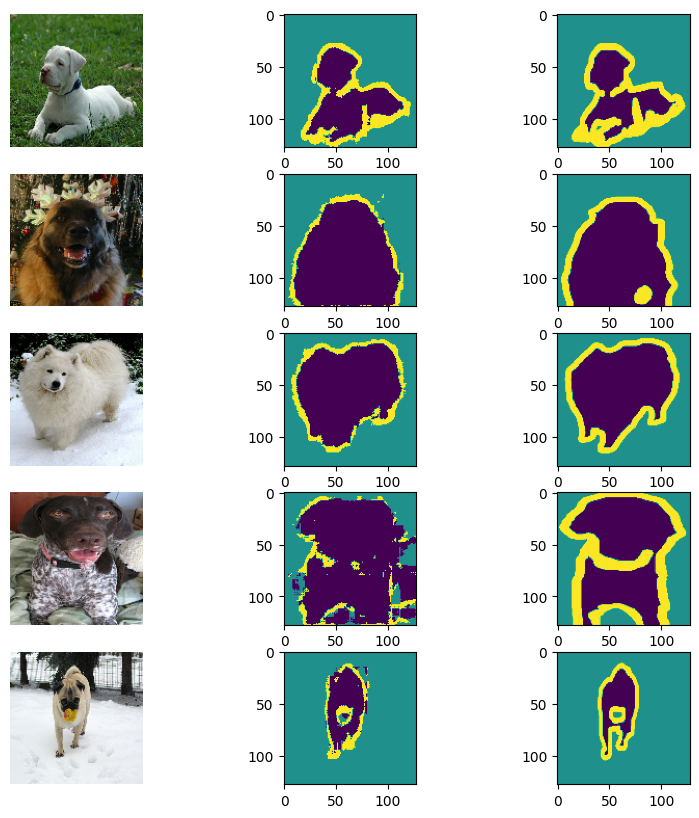

In [48]:
model = unet
plot_results(test_batch)

## Autoencoders


In [49]:
(x_train, y_trainclass), (x_test, y_testclass) = keras.datasets.mnist.load_data()

11490434/11490434 [==============================] - 1s 0us/step


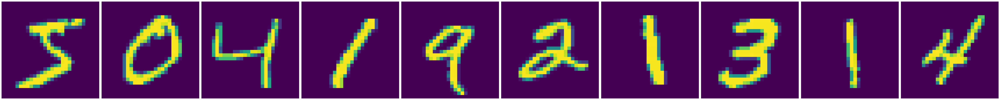

In [50]:
display_images(x_train[:10])

In [51]:
input_img = keras.Input(shape=(28,28,1))

x = keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = keras.layers.MaxPooling2D((2, 2), padding='same')(x)

encoder = keras.models.Model(input_img,encoded)

encoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_57 (Conv2D)          (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 14, 14, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_58 (Conv2D)          (None, 14, 14, 8)         1160      
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 7, 7, 8)          0         
 g2D)                                                            
                                                                 
 conv2d_59 (Conv2D)          (None, 7, 7, 8)           584 

In [52]:
latent = keras.Input(shape=(4,4,8))

x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(latent)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(16, (3, 3), activation='relu')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
decoded = keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

decoder = keras.models.Model(latent,decoded)
decoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 4, 4, 8)]         0         
                                                                 
 conv2d_60 (Conv2D)          (None, 4, 4, 8)           584       
                                                                 
 up_sampling2d_22 (UpSamplin  (None, 8, 8, 8)          0         
 g2D)                                                            
                                                                 
 conv2d_61 (Conv2D)          (None, 8, 8, 8)           584       
                                                                 
 up_sampling2d_23 (UpSamplin  (None, 16, 16, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_62 (Conv2D)          (None, 14, 14, 16)        1168

In [55]:
autoencoder = keras.models.Model(input_img,decoder(encoder(input_img)))
autoencoder.compile('adam','binary_crossentropy')

In [53]:
x_trainf = np.expand_dims(x_train,axis=-1).astype('float32') / 255.
x_testf = np.expand_dims(x_test,axis=-1).astype('float32') / 255.
x_trainf.shape

(60000, 28, 28, 1)

In [56]:
autoencoder.fit(x_trainf, x_trainf,
                epochs=25,
                batch_size=128,
                shuffle=True)

Epoch 1/25
469/469 [==============================] - 8s 9ms/step - loss: 0.2271
Epoch 2/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1533
Epoch 3/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1386
Epoch 4/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1304
Epoch 5/25
469/469 [==============================] - 4s 8ms/step - loss: 0.1258
Epoch 6/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1224
Epoch 7/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1199
Epoch 8/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1177
Epoch 9/25
469/469 [==============================] - 4s 8ms/step - loss: 0.1160
Epoch 10/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1144
Epoch 11/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1132
Epoch 12/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1120
Epoch 13/25
469/469 [====

1/1 [==============================] - 0s 383ms/step


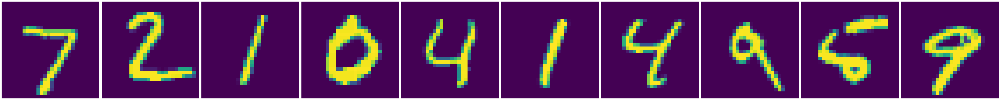

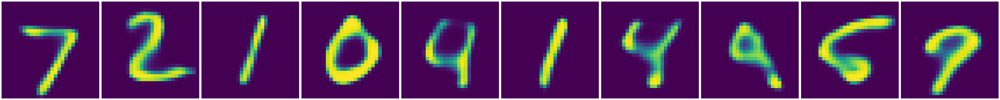

In [57]:
p_test = autoencoder.predict(x_testf[:10])
display_images(x_test[:10])
display_images(p_test[:10])

In [101]:
from PIL import Image
cat = np.expand_dims(np.array(Image.open('cat.jpg').convert('L').resize((28,28),Image.LANCZOS)),-1)/255.0

1/1 [==============================] - 0s 379ms/step


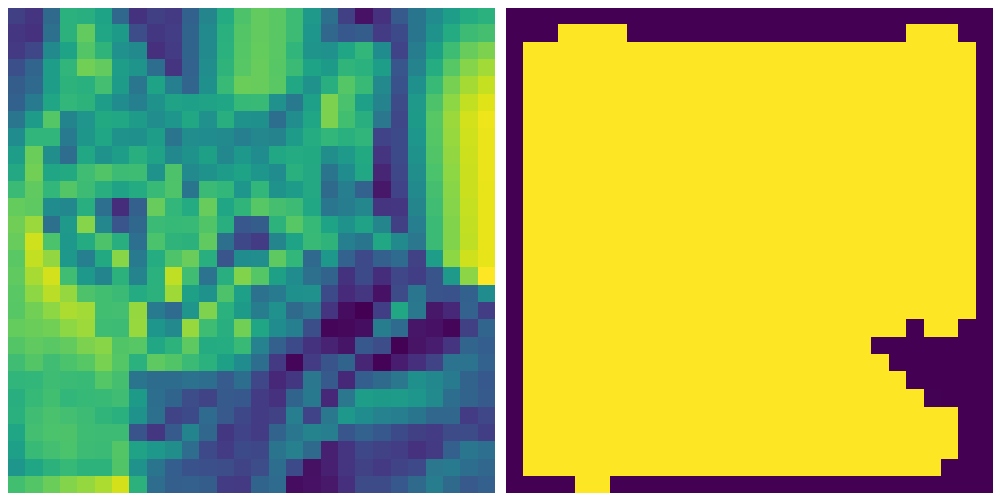

In [63]:
pcat = autoencoder.predict(np.expand_dims(cat,0))[0]
display_images([cat,pcat])

1/1 [==============================] - 0s 101ms/step


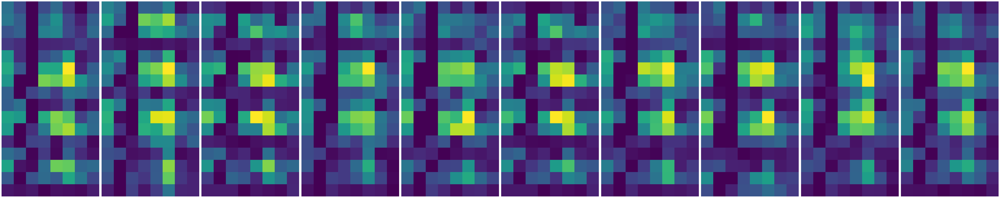

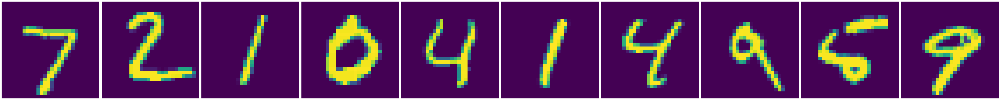

In [64]:
encoded_imgs = encoder.predict(x_testf[:10])
display_images(encoded_imgs.reshape(10,16,8))
display_images(x_testf[:10])

In [65]:
np.min(encoded_imgs), np.max(encoded_imgs)

(0.0, 49.369236)

1/1 [==============================] - 0s 34ms/step


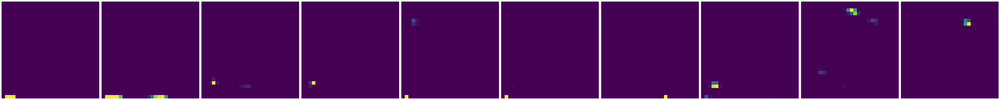

In [73]:
res = decoder.predict(50*tf.random.uniform(shape=(10,4,4,8)))
display_images(res)

1/1 [==============================] - 0s 64ms/step


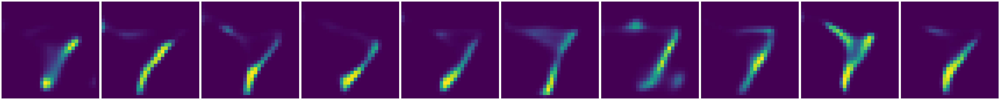

In [76]:
res = decoder.predict(10*tf.random.uniform(shape=(10,4,4,8))-10+encoded_imgs[0])
display_images(res)

1/1 [==============================] - 0s 20ms/step


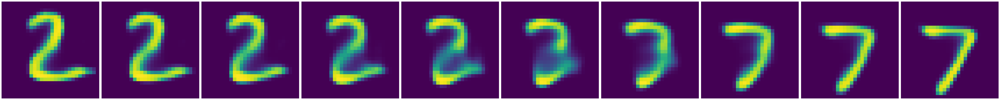

In [82]:
latents = [ encoded_imgs[0]*i/10 + encoded_imgs[1]*(10-i)/10 for i in range(10) ]
res = decoder.predict(np.array(latents))
display_images(res)

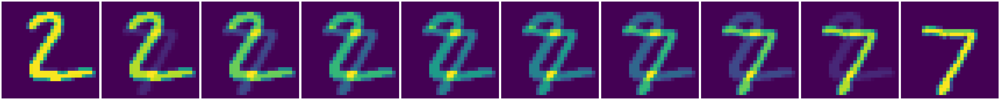

In [83]:
display_images([ x_testf[0]*i/10 + x_testf[1]*(9-i)/10 for i in range(10) ])

Autoencoders for Dim Reduction

In [118]:
input_img = keras.Input(shape=(28,28,1))

x = keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Flatten()(x)
encoded = keras.layers.Dense(2,activation='relu')(x)
encoder = keras.models.Model(input_img,encoded)

encoder.summary()

latent = keras.Input(shape=(2,))

x = keras.layers.Dense(4*4*8,activation='relu')(latent)
x = keras.layers.Reshape((4,4,8))(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(16, (3, 3), activation='relu')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
decoded = keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

decoder = keras.models.Model(latent,decoded)
decoder.summary()
autoencoder = keras.models.Model(input_img,decoder(encoder(input_img)))
autoencoder.compile('adam','binary_crossentropy')
autoencoder.fit(x_trainf, x_trainf,
                epochs=25,
                batch_size=128,
                shuffle=True)

Model: "model_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_97 (Conv2D)          (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_38 (MaxPoolin  (None, 14, 14, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 14, 14, 8)         1160      
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 7, 7, 8)          0         
 g2D)                                                            
                                                                 
 conv2d_99 (Conv2D)          (None, 7, 7, 8)           584

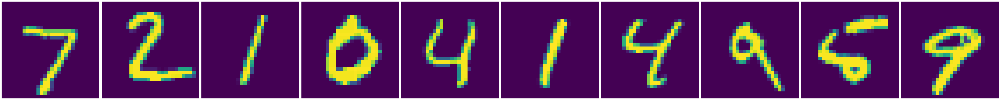

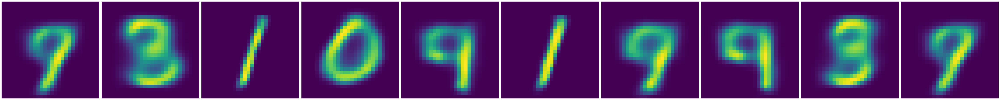

In [119]:
p_test = autoencoder.predict(x_testf[:10])
display_images(x_test[:10])
display_images(p_test[:10])

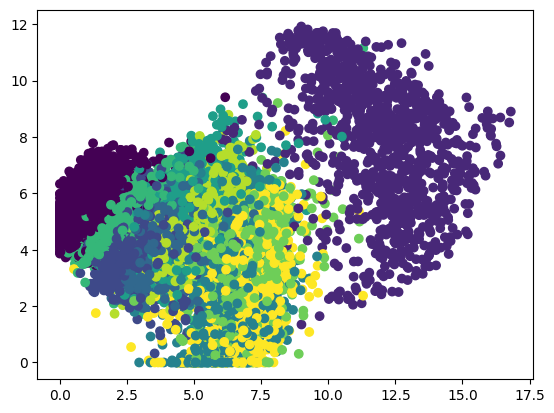

In [120]:
res = encoder.predict(x_testf)
plt.scatter(res[:,0],res[:,1],c=y_testclass)

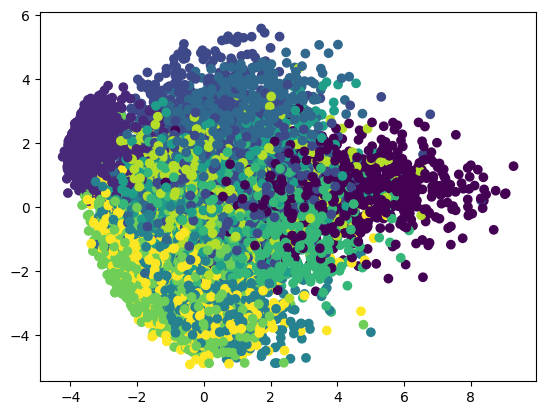

In [92]:
from sklearn.decomposition import PCA
r = PCA(n_components=2).fit_transform(x_testf.reshape(-1,784))
plt.scatter(r[:,0],r[:,1],c=y_testclass)

In [122]:
res = decoder.predict(5*tf.random.uniform(shape=(10,2))-2)
display_images(res)

ValueError: ignored

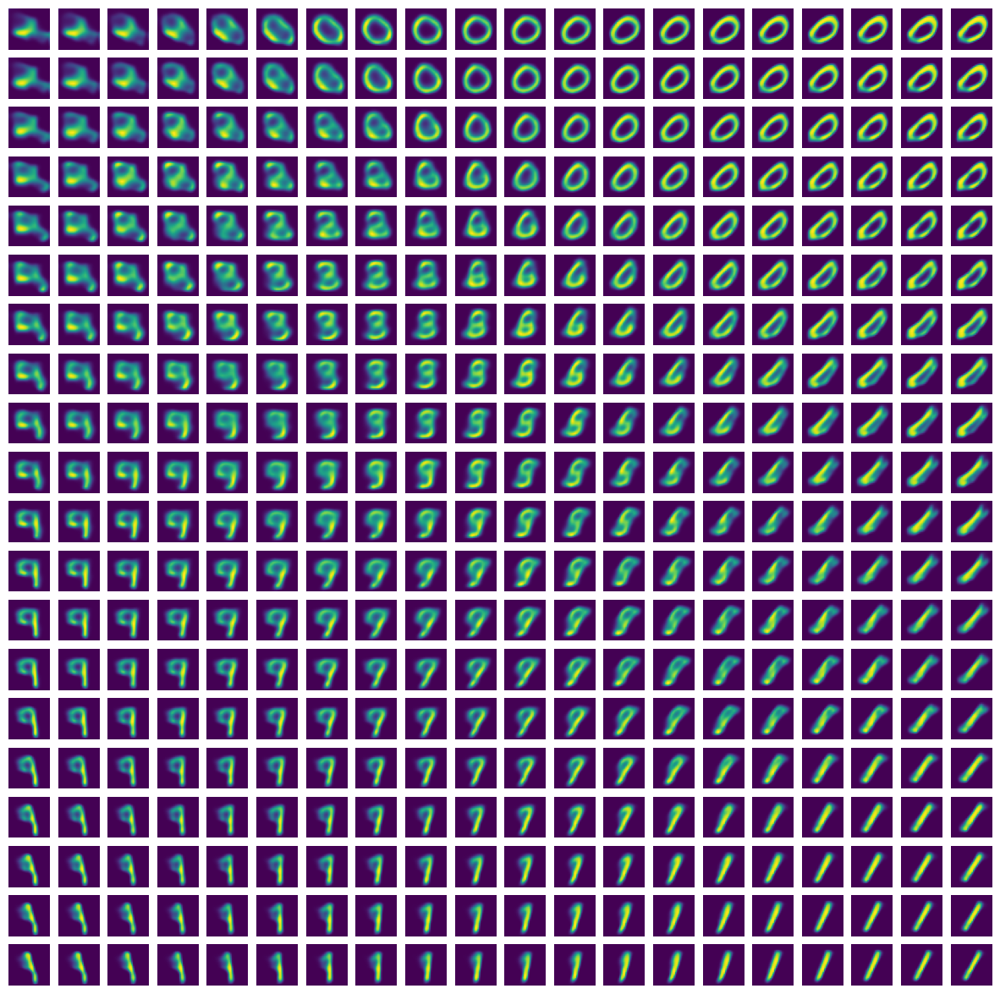

In [125]:
def plotsample(n):
  dx = np.linspace(0,10,n)
  dy = np.linspace(0,10,n)
  fig,ax = plt.subplots(n,n,figsize=(15,15))
  for i,xi in enumerate(dx):
    for j,xj in enumerate(dy):
      res = decoder.predict(np.array([xi,xj]).reshape(-1,2))[0]
      ax[i,j].imshow(res.reshape(28,28))
      ax[i,j].axis('off')
  plt.show()
  
plotsample(20)

Denoising

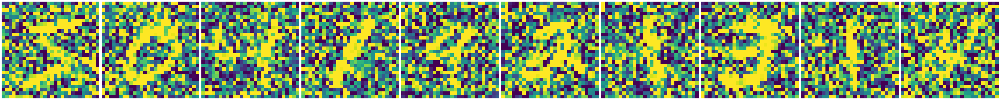

In [96]:
def noisify(data):
  return np.clip(data+np.random.normal(loc=0.5,scale=0.5,size=data.shape),0.,1.)

x_train_noise = noisify(x_trainf)
x_test_noise = noisify(x_testf)

display_images(x_train_noise[:10])

In [97]:
input_img = keras.Input(shape=(28,28,1))

x = keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = keras.layers.MaxPooling2D((2, 2), padding='same')(x)

encoder = keras.models.Model(input_img,encoded)

latent = keras.Input(shape=(4,4,8))

x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(latent)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(16, (3, 3), activation='relu')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
decoded = keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

decoder = keras.models.Model(latent,decoded)

autoencoder = keras.models.Model(input_img,decoder(encoder(input_img)))
autoencoder.compile('adam','binary_crossentropy')

autoencoder.fit(x_train_noise, x_trainf,
                epochs=25,
                batch_size=128,
                shuffle=True)

Epoch 1/25
469/469 [==============================] - 7s 7ms/step - loss: 0.2694
Epoch 2/25
469/469 [==============================] - 3s 7ms/step - loss: 0.2104
Epoch 3/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1975
Epoch 4/25
469/469 [==============================] - 4s 8ms/step - loss: 0.1900
Epoch 5/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1848
Epoch 6/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1813
Epoch 7/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1783
Epoch 8/25
469/469 [==============================] - 4s 8ms/step - loss: 0.1760
Epoch 9/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1734
Epoch 10/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1712
Epoch 11/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1693
Epoch 12/25
469/469 [==============================] - 4s 8ms/step - loss: 0.1678
Epoch 13/25
469/469 [====

1/1 [==============================] - 0s 125ms/step


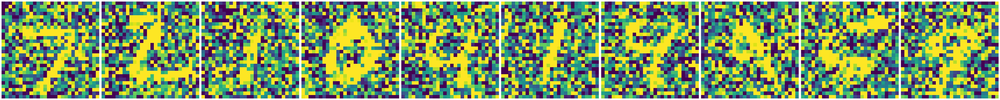

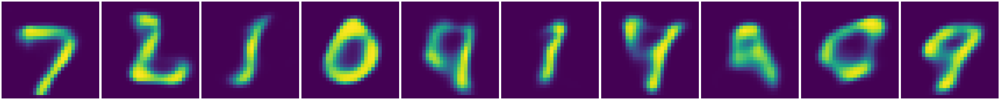

In [98]:
pred = autoencoder.predict(x_test_noise[:10])
display_images(x_test_noise[:10])
display_images(pred[:10])

1/1 [==============================] - 0s 31ms/step


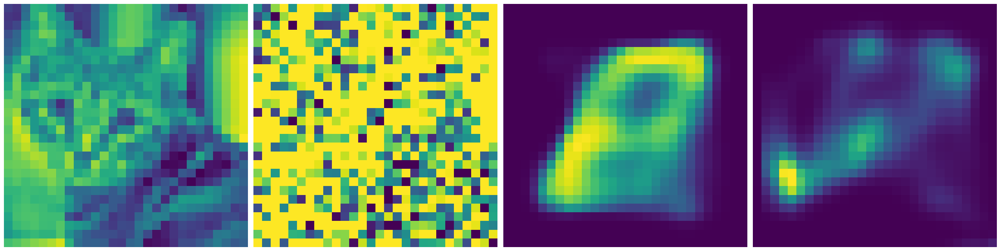

In [105]:
ncat = noisify(cat)
pred = autoencoder.predict(np.array([ncat,cat]))
display_images([cat,ncat]+list(pred))

Super-resolution

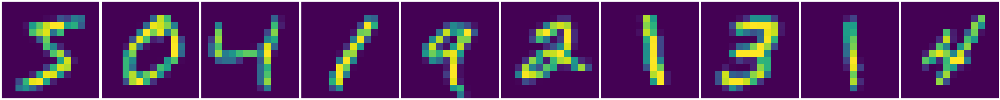

In [106]:
x_train_lr = tf.keras.layers.AveragePooling2D()(x_trainf).numpy()
x_test_lr = tf.keras.layers.AveragePooling2D()(x_testf).numpy()
display_images(x_train_lr[:10])

In [108]:
input_img = keras.Input(shape=(14,14,1))

x = keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = keras.layers.MaxPooling2D((2, 2), padding='same')(x)

encoder = keras.models.Model(input_img,encoded)

latent = keras.Input(shape=(4,4,8))

x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(latent)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
x = keras.layers.Conv2D(16, (3, 3), activation='relu')(x)
x = keras.layers.UpSampling2D((2, 2),interpolation='bilinear')(x)
decoded = keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

decoder = keras.models.Model(latent,decoded)

autoencoder = keras.models.Model(input_img,decoder(encoder(input_img)))
autoencoder.compile('adam','binary_crossentropy')

autoencoder.fit(x_train_lr, x_trainf,
                epochs=25,
                batch_size=128,
                shuffle=True)

Epoch 1/25
469/469 [==============================] - 7s 6ms/step - loss: 0.2317
Epoch 2/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1505
Epoch 3/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1389
Epoch 4/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1331
Epoch 5/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1294
Epoch 6/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1268
Epoch 7/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1246
Epoch 8/25
469/469 [==============================] - 5s 10ms/step - loss: 0.1228
Epoch 9/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1212
Epoch 10/25
469/469 [==============================] - 3s 6ms/step - loss: 0.1198
Epoch 11/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1187
Epoch 12/25
469/469 [==============================] - 3s 7ms/step - loss: 0.1176
Epoch 13/25
469/469 [===

1/1 [==============================] - 0s 260ms/step


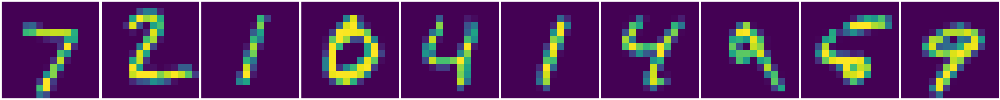

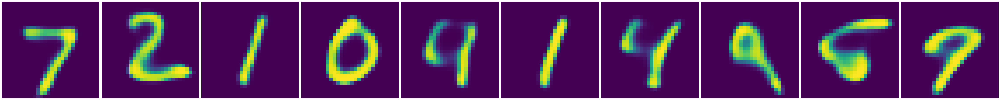

In [109]:
pred = autoencoder.predict(x_test_lr[:10])
display_images(x_test_lr[:10])
display_images(pred[:10])


## Variational Autoencoder (VAE)

In [110]:
tf.compat.v1.disable_eager_execution()

input = keras.Input(shape=(28,28,1))
x = keras.layers.Flatten()(input)
h = keras.layers.Dense(512,activation='relu')(x)
z_mean = keras.layers.Dense(2)(h)
z_log_sigma = keras.layers.Dense(2)(h)

@tf.function
def sampling(args):
    z_mean, z_log_sigma = args
    bs = tf.shape(z_mean)[0]
    epsilon = tf.random.normal(shape=(bs, 2))
    return z_mean + tf.exp(z_log_sigma) * epsilon

z = keras.layers.Lambda(sampling)([z_mean,z_log_sigma])

encoder = keras.models.Model(input, [z_mean, z_log_sigma, z])


In [111]:
latent_inputs = keras.Input(shape=(2,))
x = keras.layers.Dense(512, activation='relu')(latent_inputs)
x = keras.layers.Dense(784, activation='sigmoid')(x)
outputs = keras.layers.Reshape((28,28,1))(x)
decoder = keras.models.Model(latent_inputs, outputs)

outs = decoder(encoder(input)[2])
vae = keras.models.Model(input, outs)

In [112]:
@tf.function
def vae_loss(x1,x2):
  x1 = keras.layers.Flatten()(x1)
  x2 = keras.layers.Flatten()(x2)
  reconstruction_loss = keras.losses.mse(x1,x2)*784
  tmp = 1 + z_log_sigma - tf.square(z_mean) - tf.exp(z_log_sigma)
  kl_loss = -0.5*tf.reduce_sum(tmp, axis=-1)
  return tf.convert_to_tensor(tf.reduce_mean(reconstruction_loss + kl_loss))

vae.compile(optimizer='rmsprop', loss=vae_loss)


In [113]:
vae.fit(x_trainf, x_trainf,
                epochs=25,
                batch_size=128,
                shuffle=True)

Train on 60000 samples
Epoch 1/25
60000/60000 [==============================] - 4s 69us/sample - loss: 48.0509
Epoch 2/25
60000/60000 [==============================] - 3s 47us/sample - loss: 41.0149
Epoch 3/25
60000/60000 [==============================] - 2s 32us/sample - loss: 40.0583
Epoch 4/25
60000/60000 [==============================] - 2s 32us/sample - loss: 39.3507
Epoch 5/25
60000/60000 [==============================] - 2s 32us/sample - loss: 38.8300
Epoch 6/25
60000/60000 [==============================] - 2s 32us/sample - loss: 38.4284
Epoch 7/25
60000/60000 [==============================] - 2s 33us/sample - loss: 38.0903
Epoch 8/25
60000/60000 [==============================] - 3s 48us/sample - loss: 37.8122
Epoch 9/25
60000/60000 [==============================] - 2s 33us/sample - loss: 37.5816
Epoch 10/25
60000/60000 [==============================] - 2s 32us/sample - loss: 37.3560
Epoch 11/25
60000/60000 [==============================] - 2s 32us/sample - loss: 37.1

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


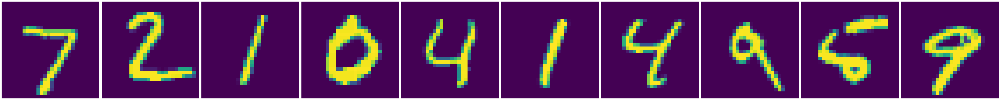

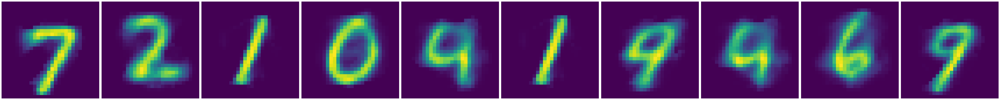

In [114]:
pred = vae.predict(x_testf[:10])
display_images(x_testf[:10])
display_images(pred[:10])

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


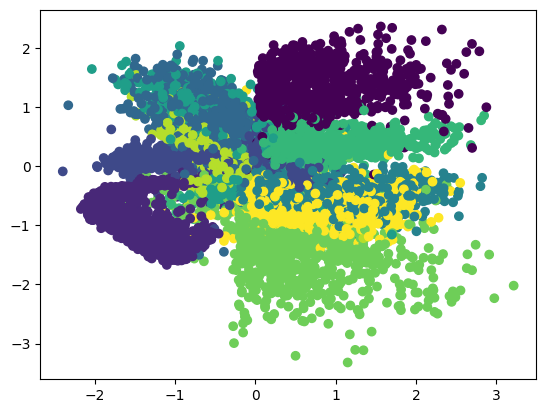

In [115]:
res = encoder.predict(x_testf)[0]
plt.scatter(res[:,0],res[:,1],c=y_testclass)

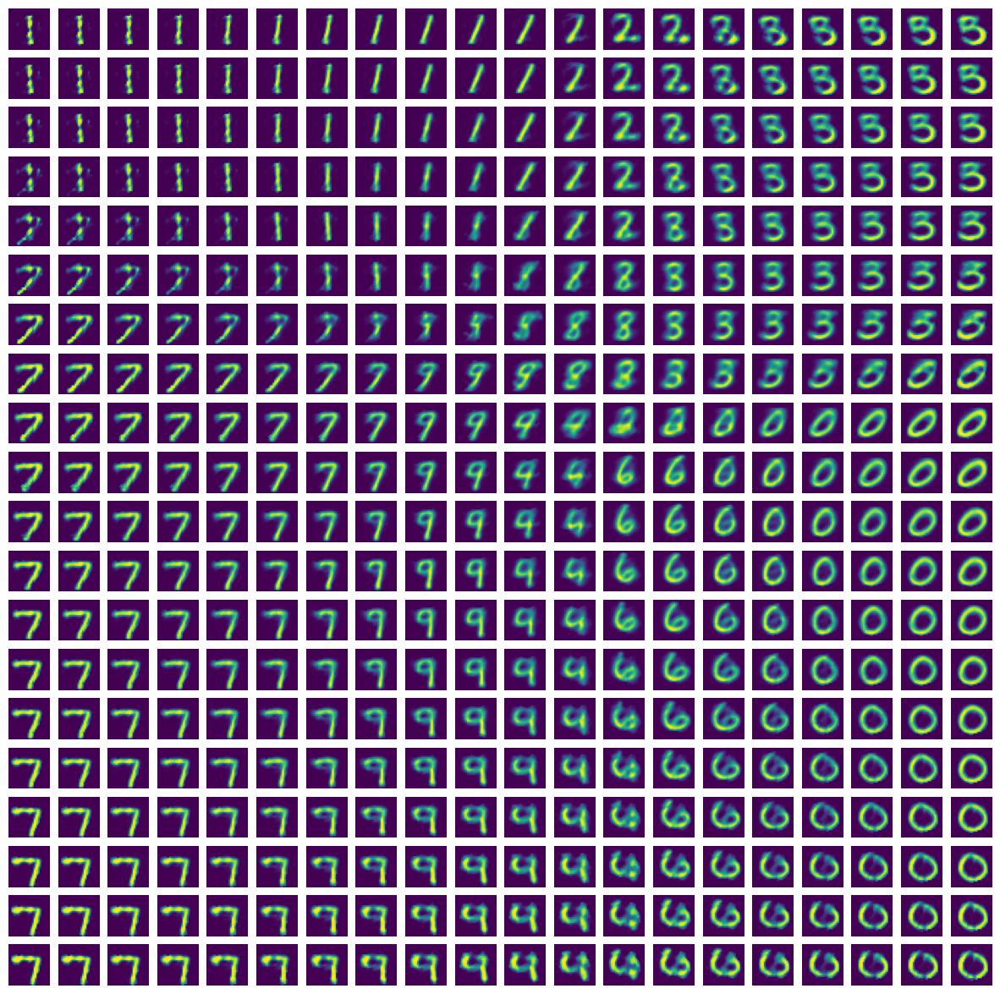

In [117]:
def plotsample(n):
  dx = np.linspace(-2,3,n)
  dy = np.linspace(-3,2,n)
  fig,ax = plt.subplots(n,n,figsize=(15,15))
  for i,xi in enumerate(dx):
    for j,xj in enumerate(dy):
      res = decoder.predict(np.array([xi,xj]).reshape(-1,2))[0]
      ax[i,j].imshow(res.reshape(28,28))
      ax[i,j].axis('off')
  plt.show()
  
plotsample(20)

## GANs

In [126]:
from keras.layers import Conv2D, LeakyReLU, ZeroPadding2D, BatchNormalization,Dropout,Flatten,Dense
from keras.models import Sequential

discriminator = Sequential()

discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(28,28,1), padding="same"))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
discriminator.add(ZeroPadding2D(padding=((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))

optimizer = keras.optimizers.legacy.Adam(0.0001)

discriminator.compile(loss='binary_crossentropy',optimizer=optimizer)

Instructions for updating:
Colocations handled automatically by placer.


In [127]:
from keras.layers import Reshape, UpSampling2D, Conv2DTranspose, Activation

generator = Sequential()
generator.add(Dense(128 * 7 * 7, activation="relu", input_dim=100))
generator.add(Reshape((7, 7, 128)))
generator.add(UpSampling2D())
generator.add(Conv2DTranspose(128, kernel_size=3, padding="same"))
generator.add(BatchNormalization(momentum=0.8))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2DTranspose(64, kernel_size=3, padding="same"))
generator.add(BatchNormalization(momentum=0.8))
generator.add(Activation("relu"))
generator.add(Conv2DTranspose(1, kernel_size=3, padding="same"))
generator.add(Activation("tanh"))

generator.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['accuracy'])

In [128]:
discriminator.trainable = False
adversarial = Sequential()
adversarial.add(generator)
adversarial.add(discriminator)
adversarial.compile(loss='binary_crossentropy', optimizer=optimizer)

epoch: 0, [Discriminator :: d_loss: 0.938581], [ Generator :: loss: 0.683758]


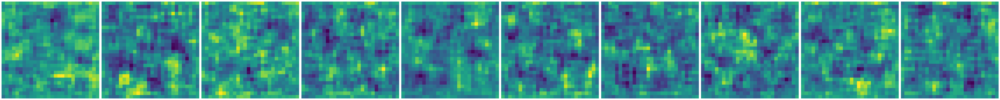

epoch: 100, [Discriminator :: d_loss: 0.322440], [ Generator :: loss: 0.736188]


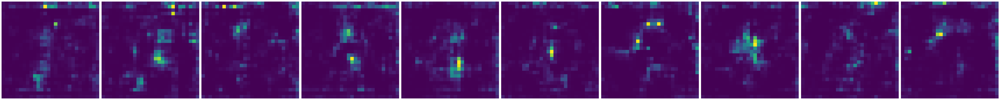

epoch: 200, [Discriminator :: d_loss: 0.462082], [ Generator :: loss: 1.295473]


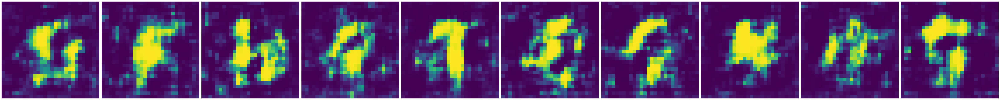

epoch: 300, [Discriminator :: d_loss: 0.558975], [ Generator :: loss: 0.708360]


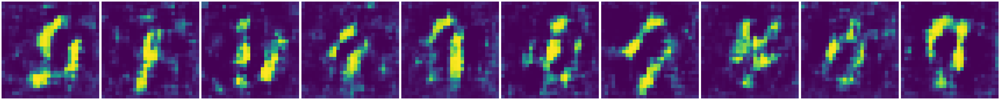

epoch: 400, [Discriminator :: d_loss: 0.540825], [ Generator :: loss: 0.878303]


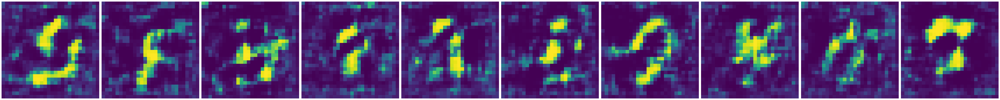

epoch: 500, [Discriminator :: d_loss: 0.840801], [ Generator :: loss: 0.966723]


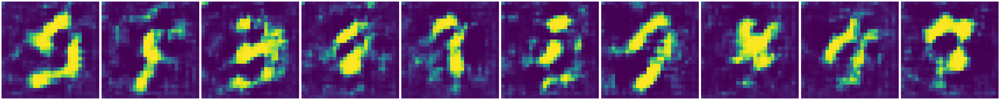

epoch: 600, [Discriminator :: d_loss: 0.455949], [ Generator :: loss: 0.872061]


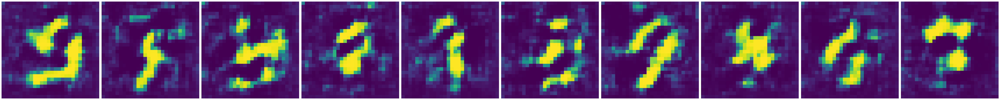

epoch: 700, [Discriminator :: d_loss: 0.488734], [ Generator :: loss: 0.777448]


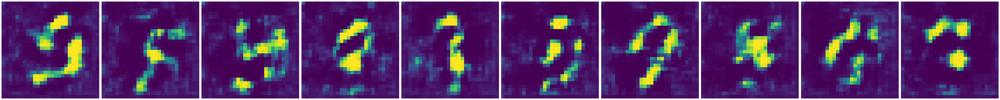

epoch: 800, [Discriminator :: d_loss: 0.296161], [ Generator :: loss: 0.987130]


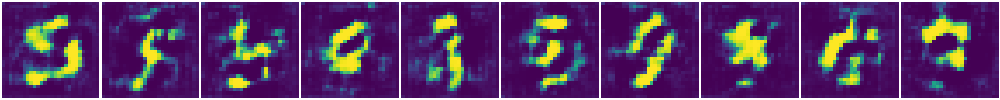

epoch: 900, [Discriminator :: d_loss: 0.383935], [ Generator :: loss: 1.370422]


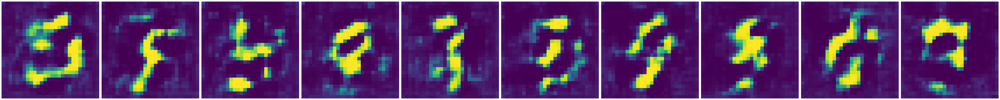

In [129]:
X_train = x_trainf*2.0-1.0

batch=32

y_labeled = np.ones((batch, 1))
y_mislabeled = np.zeros((batch, 1))
sample_noise = np.random.normal(0,1,(10,100))

for cnt in range(1000):
## train discriminator
  random_index =  np.random.randint(0, len(X_train) - batch)
  legit_images = X_train[random_index : random_index + batch].reshape(batch, 28, 28, 1)
  gen_noise = np.random.normal(0, 1, (batch,100))
  syntetic_images = generator.predict(gen_noise)
  d_loss_1 = discriminator.train_on_batch(legit_images, y_labeled)
  d_loss_2 = discriminator.train_on_batch(syntetic_images, y_mislabeled)
  d_loss = 0.5*np.add(d_loss_1,d_loss_2)
# train generator
  g_loss = adversarial.train_on_batch(gen_noise, y_labeled)
  if cnt%100==0:
    print ('epoch: %d, [Discriminator :: d_loss: %f], [ Generator :: loss: %f]' % (cnt, d_loss, g_loss))
    imgs = generator.predict(sample_noise)
    display_images(imgs)